# 1.この課題の目的
実データに近いものの分析を行う  
データセットに対して自ら課題を設定できるようにする

## 【問題1】コンペティション内容の把握  
以下の観点に気をつけて、どのようなコンペティションなのかレポートしてください。

このコンペティションでは何を予測する？目的変数は？  
企業がこのコンペティションを開催することで得られるメリットは？  
データセットを見る前の段階で考えられる予測結果に影響してきそうなことは？

今回のカグル　https://www.kaggle.com/c/home-credit-default-risk  

・目的変数は返済能力があるかないか（２値分類）  
・企業のメリット  
　より良いデータ分析により、適切な貸し出しができるようになる 。  
　信用情報があまりない人々にも貸し出すことができるようになるので、業務が拡大できる。  
・予測結果に影響してきそうなこと  
 　　所得、家族構成、みため、住所、ローン履歴、フォロワー数  年齢
  



カーネルは自由に見て活用してください。

＜参考カーネル＞
https://www.kaggle.com/gpreda/home-credit-default-risk-extensive-eda  
https://www.kaggle.com/shivamb/homecreditrisk-extensive-eda-baseline-0-772  
https://www.kaggle.com/osciiart/homecreditrisk-extensive-eda-baseline-model-jp  

## 【問題2】データの概観
データの概観を把握してください。  
.head()、.info()、describe()などを使う  
欠損値の有無を見る  
クラスごとのデータ数をグラフに出す  
コードと表・グラフだけではなく、結果に対する説明や考察も行ってください。  



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno
pd.set_option('display.max_columns', 130) #カラムの表示を省略されないように１００に設定
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()

#CufflinksでPandasのデータフレームをPlotlyに一発描画
import cufflinks as cf
cf.go_offline()


In [2]:
train = pd.read_csv("application_train.csv")

In [3]:
train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [4]:
train.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [5]:
train.shape

(307511, 122)

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


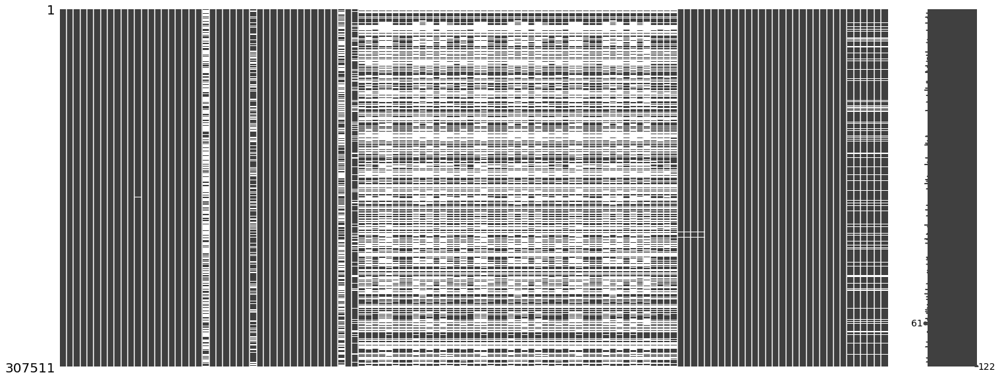

In [7]:
#欠損値の確認
#感想、真ん中あたりの特徴の欠損目立つ
msno.matrix(train) 

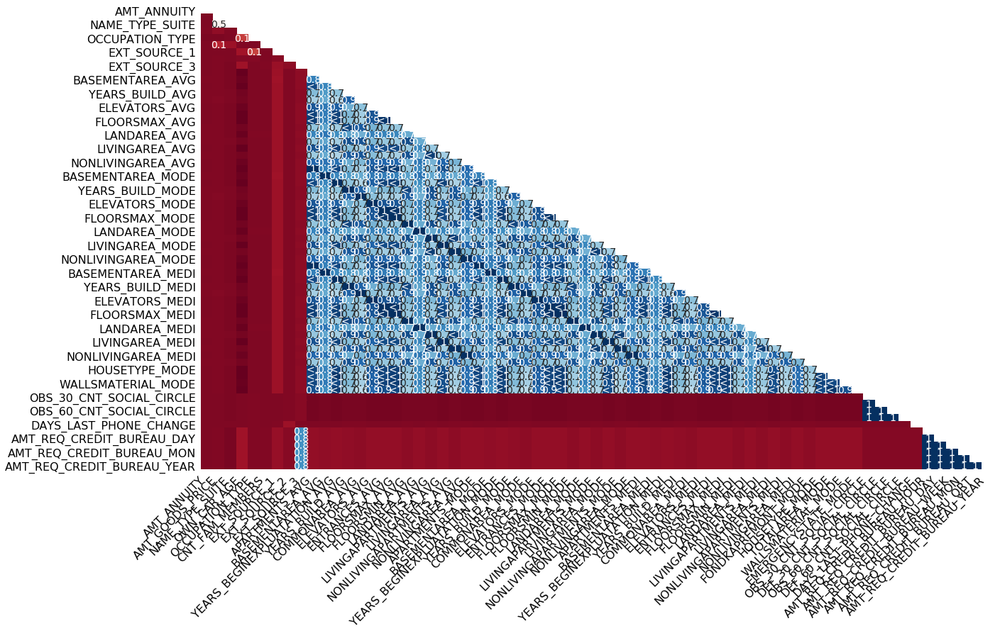

In [8]:
##欠損の発生箇所の相関がかなり高めなので、相関関係がある。
msno.heatmap(train) #各列の欠損値の発生箇所についての相関

#### クラスごとのデータ数をグラフに出す  
ラベル数の偏りがある。約９対１。  
おそらくラベル０が返済済みであるとみれる。  
常識的に考えて返済できない人の方が多いというのはないと思われる。

<function matplotlib.pyplot.show(*args, **kw)>

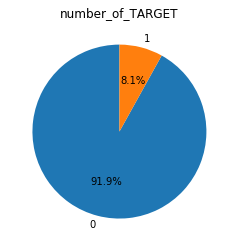

In [9]:
plt.title("number_of_TARGET")
label0_count = train["TARGET"][train["TARGET"]==0].count()
label1_count = train["TARGET"][train["TARGET"]==1].count()
label_count_list= [label0_count, label1_count]
label = [0,1]
plt.pie(label_count_list,  labels=label, startangle=90, autopct="%1.1f%%") #startangleで開始時の角度を設定できる
plt.show

## 【問題3】課題設定  
データの概観を見たことを元に、自分なりの課題・疑問を複数設定してください。

TARGETと各特徴量の相関が知りたい。
欠損量の相関がある特徴の意味が気になる。
→細かい住居の建物の情報などが多い

## 【問題4】データ探索
問題3で設定した課題・疑問を解決するためにデータ探索を進めましょう。  
過程で新しい疑問点などが生まれた場合は、加えていってください。  

課題合格の条件として、表やグラフを 合計15個以上 出力してください。そして、  
それに対してマークダウンを使い考察を加えていきましょう



In [10]:
# 相関係数行列のヒートマップを作り、相関係数の高い関係を見つける
train_corr = train.copy().corr()
print(train_corr)

                             SK_ID_CURR    TARGET  CNT_CHILDREN  \
SK_ID_CURR                     1.000000 -0.002108     -0.001129   
TARGET                        -0.002108  1.000000      0.019187   
CNT_CHILDREN                  -0.001129  0.019187      1.000000   
AMT_INCOME_TOTAL              -0.001820 -0.003982      0.012882   
AMT_CREDIT                    -0.000343 -0.030369      0.002145   
AMT_ANNUITY                   -0.000433 -0.012817      0.021374   
AMT_GOODS_PRICE               -0.000232 -0.039645     -0.001827   
REGION_POPULATION_RELATIVE     0.000849 -0.037227     -0.025573   
DAYS_BIRTH                    -0.001500  0.078239      0.330938   
DAYS_EMPLOYED                  0.001366 -0.044932     -0.239818   
DAYS_REGISTRATION             -0.000973  0.041975      0.183395   
DAYS_ID_PUBLISH               -0.000384  0.051457     -0.028019   
OWN_CAR_AGE                    0.001818  0.037612      0.008494   
FLAG_MOBIL                     0.002804  0.000534      0.00104

In [11]:
train_corr_target = train_corr.iloc[1].sort_values(ascending=True)
train_corr_target

EXT_SOURCE_3                  -0.178919
EXT_SOURCE_2                  -0.160472
EXT_SOURCE_1                  -0.155317
DAYS_EMPLOYED                 -0.044932
FLOORSMAX_AVG                 -0.044003
FLOORSMAX_MEDI                -0.043768
FLOORSMAX_MODE                -0.043226
AMT_GOODS_PRICE               -0.039645
REGION_POPULATION_RELATIVE    -0.037227
ELEVATORS_AVG                 -0.034199
ELEVATORS_MEDI                -0.033863
FLOORSMIN_AVG                 -0.033614
FLOORSMIN_MEDI                -0.033394
LIVINGAREA_AVG                -0.032997
LIVINGAREA_MEDI               -0.032739
FLOORSMIN_MODE                -0.032698
TOTALAREA_MODE                -0.032596
ELEVATORS_MODE                -0.032131
LIVINGAREA_MODE               -0.030685
AMT_CREDIT                    -0.030369
APARTMENTS_AVG                -0.029498
APARTMENTS_MEDI               -0.029184
FLAG_DOCUMENT_6               -0.028602
APARTMENTS_MODE               -0.027284
LIVINGAPARTMENTS_AVG          -0.025031


In [12]:
# train_corrの1行目TARGETを抜き出し,ソートして上位30にする
train_corr_head30 = train_corr_target.head(30).index
print(train_corr_head30)

Index(['EXT_SOURCE_3', 'EXT_SOURCE_2', 'EXT_SOURCE_1', 'DAYS_EMPLOYED',
       'FLOORSMAX_AVG', 'FLOORSMAX_MEDI', 'FLOORSMAX_MODE', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'ELEVATORS_AVG', 'ELEVATORS_MEDI',
       'FLOORSMIN_AVG', 'FLOORSMIN_MEDI', 'LIVINGAREA_AVG', 'LIVINGAREA_MEDI',
       'FLOORSMIN_MODE', 'TOTALAREA_MODE', 'ELEVATORS_MODE', 'LIVINGAREA_MODE',
       'AMT_CREDIT', 'APARTMENTS_AVG', 'APARTMENTS_MEDI', 'FLAG_DOCUMENT_6',
       'APARTMENTS_MODE', 'LIVINGAPARTMENTS_AVG', 'LIVINGAPARTMENTS_MEDI',
       'HOUR_APPR_PROCESS_START', 'FLAG_PHONE', 'LIVINGAPARTMENTS_MODE',
       'BASEMENTAREA_AVG'],
      dtype='object')


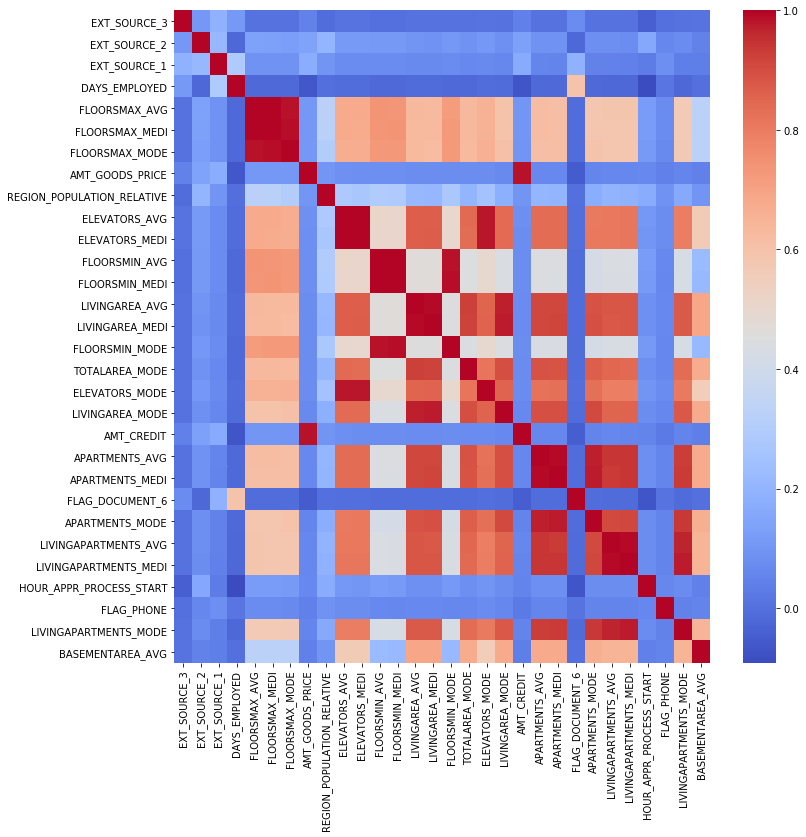

In [13]:
# dataが多いのでTARGETの負の相関が高い上位30を表示
fig, ax = plt.subplots(figsize=(12,12))
sns.heatmap(train_corr.loc[train_corr_head30,train_corr_head30],cmap='coolwarm')

In [14]:
train_corr.loc[train_corr_head30,train_corr_head30].shape

(30, 30)

#### TARGETと負の相関が高いもののヒートマップで表示した.
#### 相関が高いものはほとんど同一の特徴量ではないかと考えられる.
#### 相関が高いものの組み合わせが多いと感じる

In [15]:
# 欠損値が多いものを表示
total_null_number =train.isnull().sum().sort_values(ascending=False)

all_number = 301571 # numbers of data per columns is 1460
#print(all_number)
missing_rate = total_null_number / all_number

df_null_with_value = pd.DataFrame({'total_null_number':total_null_number, 'missing_rate':missing_rate})
#print('{}'.format(missing_rate*100))
#df_null = (df_null_with_value[(df_null_with_value.total_null_number>0)])
#f, ax = plt.subplots(figsize=(12,12))
#sns.barplot(x=df_null['total_null_number'], y=df_null.index)
#plt.title('total_null_number')
#plt.show()

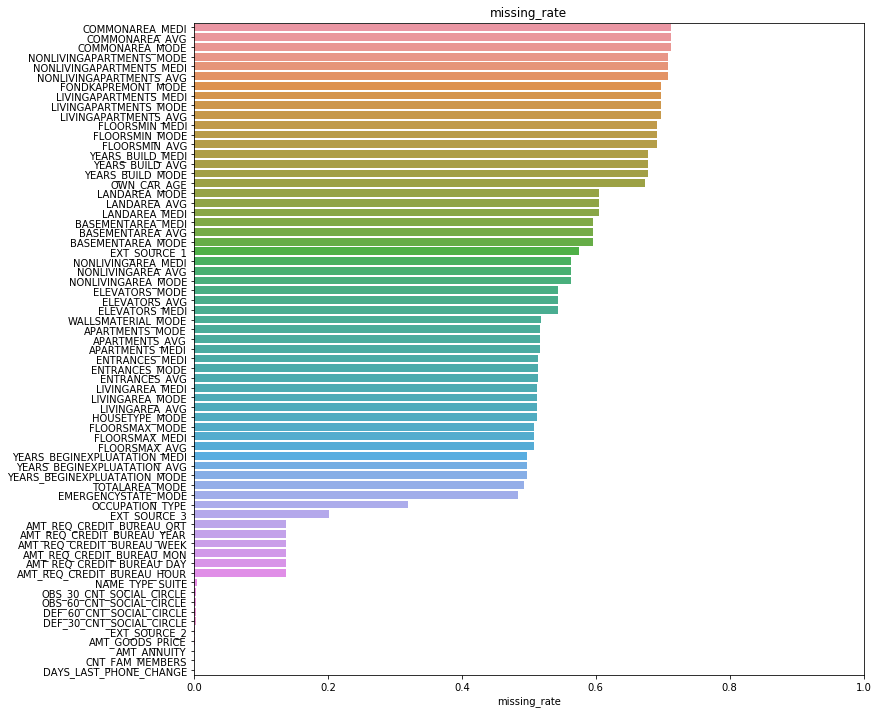

In [16]:
df_null = (df_null_with_value[(df_null_with_value.total_null_number>0)])
f, ax = plt.subplots(figsize=(12,12))
sns.barplot(x=df_null['missing_rate'], y=df_null.index)
ax.set_xlim(0, 1)
plt.title('missing_rate')
plt.show()

#### 欠損値の割合を虹色のグラデーションの棒グラフで表示した
#### 欠損値10%以上は列を削除してもよいのではないかと考えた

In [17]:
train2 = pd.get_dummies(train, dtype=int)
train2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 246 entries, SK_ID_CURR to EMERGENCYSTATE_MODE_Yes
dtypes: float64(65), int64(181)
memory usage: 577.1 MB


In [18]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split

"""LightGBM を使った二値分類からの重要度プロット"""

X = train2.drop("TARGET",axis=1)
y = train2.iloc[:,1]
X_train, X_test, y_train, y_test = train_test_split(X, y)

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)

    # LightGBM のハイパーパラメータ
lgbm_params = {
        # 二値分類問題
    'objective': 'binary',
    # AUC の最大化を目指す
    'metric': 'auc',
}

model = lgb.train(lgbm_params, lgb_train, valid_sets=lgb_eval)
    

/Users/morio/.pyenv/versions/anaconda3-5.3.0/lib/python3.6/site-packages/lightgbm/__init__.py:46: UserWarning:

Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.1) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.



[1]	valid_0's auc: 0.710391
[2]	valid_0's auc: 0.716474
[3]	valid_0's auc: 0.720281
[4]	valid_0's auc: 0.723229
[5]	valid_0's auc: 0.724976
[6]	valid_0's auc: 0.72728
[7]	valid_0's auc: 0.728672
[8]	valid_0's auc: 0.729918
[9]	valid_0's auc: 0.730687
[10]	valid_0's auc: 0.732295
[11]	valid_0's auc: 0.733233
[12]	valid_0's auc: 0.734768
[13]	valid_0's auc: 0.735886
[14]	valid_0's auc: 0.736801
[15]	valid_0's auc: 0.738043
[16]	valid_0's auc: 0.738916
[17]	valid_0's auc: 0.739745
[18]	valid_0's auc: 0.740819
[19]	valid_0's auc: 0.741373
[20]	valid_0's auc: 0.742408
[21]	valid_0's auc: 0.743741
[22]	valid_0's auc: 0.744241
[23]	valid_0's auc: 0.745441
[24]	valid_0's auc: 0.746047
[25]	valid_0's auc: 0.746559
[26]	valid_0's auc: 0.747168
[27]	valid_0's auc: 0.747772
[28]	valid_0's auc: 0.748281
[29]	valid_0's auc: 0.748594
[30]	valid_0's auc: 0.749178
[31]	valid_0's auc: 0.750132
[32]	valid_0's auc: 0.750287
[33]	valid_0's auc: 0.750738
[34]	valid_0's auc: 0.750887
[35]	valid_0's auc: 0.75

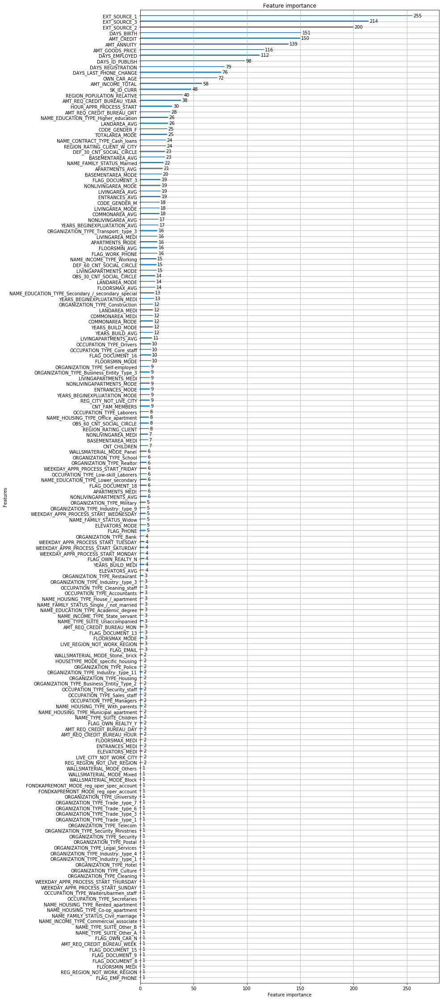

In [19]:
# 特徴量の重要度出力
#print(model.feature_importance())

# 特徴量の重要度をプロット
lgb.plot_importance(model, figsize=(12,40))

In [20]:
fti = model.feature_importance()

In [21]:
ftidf = pd.DataFrame({"FTI":fti,"columns":X_train.columns}).sort_values('FTI', ascending=False)

In [22]:
ftidf_head10 = ftidf["columns"].head(10)
print(ftidf_head10)

28         EXT_SOURCE_1
30         EXT_SOURCE_3
29         EXT_SOURCE_2
7            DAYS_BIRTH
3            AMT_CREDIT
4           AMT_ANNUITY
5       AMT_GOODS_PRICE
8         DAYS_EMPLOYED
10      DAYS_ID_PUBLISH
9     DAYS_REGISTRATION
Name: columns, dtype: object


In [23]:
# one_hot_columnsにはcolumn名のリスト（例：['TARGET','NAME_CONTRACT_TYPE'...]）が入ります。
# trainには自分のデータを入れてください。
#one_hot_columns = ftidf["columns"].head(10) 
#row = len(one_hot_columns)
#count = 0
#plt.figure(figsize=(20,20))
#for col in one_hot_columns:
    
   # plt.subplot(row,2,count+1)
   # sns.countplot(train.loc[train['TARGET'] != 0][col],order = train[col].value_counts().index)
   # plt.title('label=1')
    
   # plt.subplot(row,2,count+2)
   # plt.title('label=0')
   # sns.countplot(train.loc[train['TARGET'] == 0][col],order = train[col].value_counts().index)
   # count+=2

In [24]:
x = train['EXT_SOURCE_1']
y = train['TARGET']

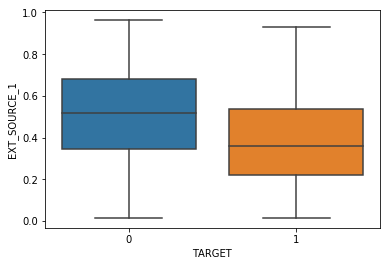

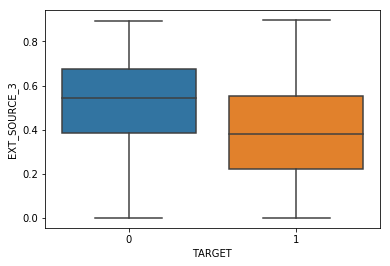

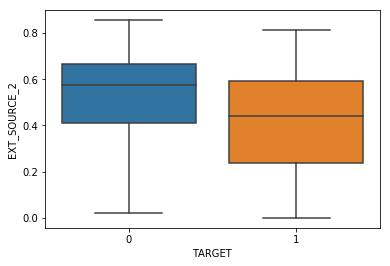

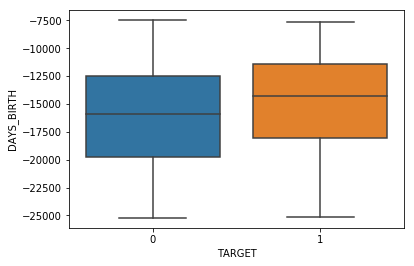

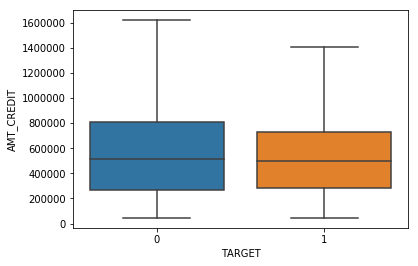

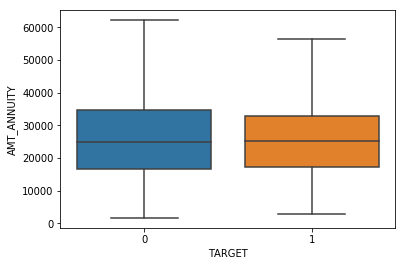

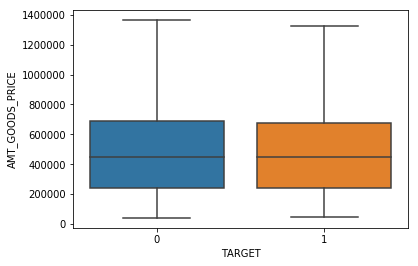

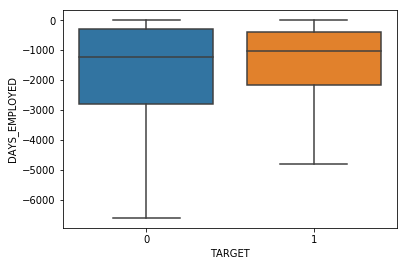

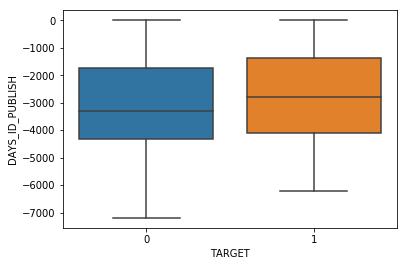

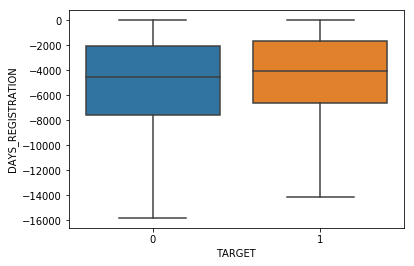

In [25]:
for col in ftidf_head10:
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    sns.boxplot(x=y, y=train[col], data=train, showfliers=False, ax=ax)
    plt.show

#### 箱ひげ図の考察
#### EXT SOUCE 1,2,3いずれも最大最小はほぼ変わらず中央値は返済できない側で低い傾向となった
#### AMT CREDIT は中央値が変わらず最大値は返済できた側で高かった
#### DAYS BIRTH は返済できた側の中央値が高く年齢が高い方が返済能力が高い可能性があると考えられる
#### AMT ANNUITY から返済できた側の年金が高いと考えられる.
#### AMT GOODS PRICE はほとんど差が読み取れなかった
#### DAYS EMPLOYED は返済できた側の方が労働期間が長い傾向にあると示唆された
#### DAYS PUBLISHから返済できた側の方が日数が長くなっていると思われた
#### DAYS REGISTRATIONに関して返済できた側の方が日数が長い傾向が見られた.

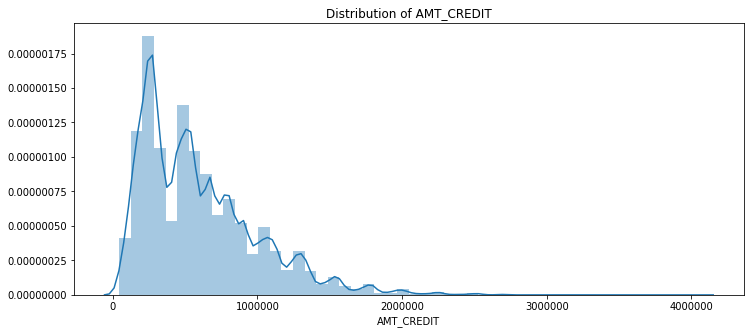

In [26]:
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_CREDIT")
ax = sns.distplot(train["AMT_CREDIT"])

#### 歪度が高い分布になっている。２００００００以上はデータ数が少ない

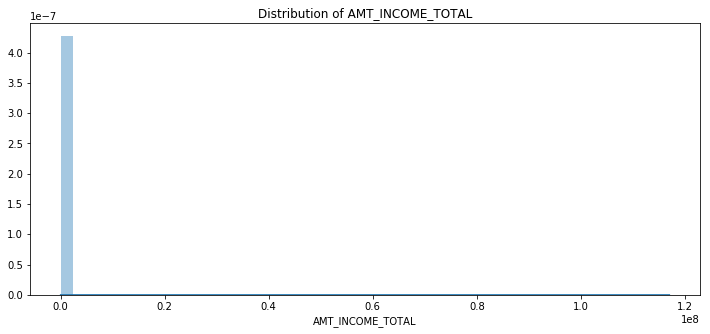

In [27]:
plt.figure(figsize=(12,5))
plt.title("Distribution of AMT_INCOME_TOTAL")
ax = sns.distplot(train["AMT_INCOME_TOTAL"].dropna())

#### 最大値が大きいため、ものすごく偏った分布図になっている

# ーーーーーここ変えましたーーーーーー


NAME_TYPE_SUITE　　同伴者

仮説：一人もしくは家族づれが多いのでは

In [28]:
temp = train["NAME_TYPE_SUITE"].value_counts()
#print("Total number of states : ",len(temp))
trace = go.Bar(
    x = temp.index,
    y = (temp / temp.sum())*100,
)
data = [trace]
layout = go.Layout(
    title = "Who accompanied client when applying for the  application in % ",
    xaxis=dict(
        title='Name of type of the Suite',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of Name of type of the Suite in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='schoolStateNames')

In [29]:
train["NAME_TYPE_SUITE"].value_counts().index

Index(['Unaccompanied', 'Family', 'Spouse, partner', 'Children', 'Other_B',
       'Other_A', 'Group of people'],
      dtype='object')

#### ほとんどは同伴者なしで申し込みしていることがわかる。ついでファミリーが多い

仮説：同伴者がいると返却率が高いのでは

In [57]:
temp = train["NAME_TYPE_SUITE"].value_counts()
temp1= train[train["TARGET"] == 1]["NAME_TYPE_SUITE"].value_counts()
#print("Total number of states : ",len(temp))
trace = go.Bar(
    x = temp1.index,
    y = (temp1 / temp)*100
)
data = [trace]
layout = go.Layout(
    title = "non Repayment rate ",
    xaxis=dict(
        title='Name of type of the Suite',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of Name of type of the Suite in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='schoolStateNames')

結果としては、一人での申し込みは返却率が悪い。

ファミリーと子供が返却率が高くなっている。この場合同伴者が返済を助けるので返却率が良いのでは？

（アザーはなんなのか良くわからないしサンプル数が少ない）



<function matplotlib.pyplot.show(*args, **kw)>

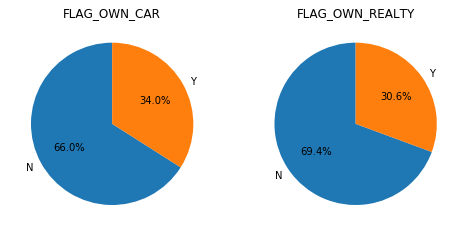

In [58]:
emp1 = train["FLAG_OWN_CAR"].value_counts() #車持っているか
temp2 = train["FLAG_OWN_REALTY"].value_counts() #家持っているか
fig = plt.figure(figsize=(8, 8))
ax1 = plt.subplot(1,2,1)
ax1.set_title('FLAG_OWN_CAR')
ax1.pie(emp1 , labels=["N","Y"], startangle=90, autopct="%1.1f%%") 
ax2 = plt.subplot(1,2,2)
ax2.set_title('FLAG_OWN_REALTY')
ax2.pie(temp2 , labels=["N","Y"], startangle=90, autopct="%1.1f%%") 
plt.show

#### 二つの特徴はわりと近いパーセンテージになっている。所持率は思ったより低い

 # --------ここ変えました-------------

NAME_INCOME_TYPE　収入のタイプ

仮説：労働者がほとんどなのでは

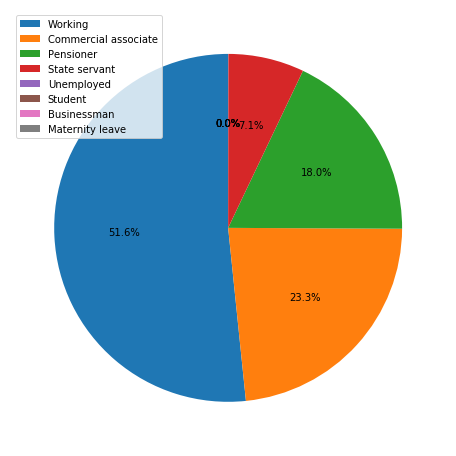

In [100]:
temp = train["NAME_INCOME_TYPE"].value_counts()
plt.title = ("NAME_INCOME_TYPE")
plt.figure(figsize=(8, 8))
plt.pie(temp,startangle=90, autopct="%1.1f%%") 
plt.legend(temp.index)
plt.show()

#### workingが半分程度と意外と少ない

仮説：state servant国家公務員は返済率が高そう

In [101]:
#'Unemployed', 'Student', 'Businessman', 'Maternity leave'はデータ数が少なすぎるので消します
a = train["NAME_INCOME_TYPE"].value_counts().index
a

Index(['Working', 'Commercial associate', 'Pensioner', 'State servant',
       'Unemployed', 'Student', 'Businessman', 'Maternity leave'],
      dtype='object')

In [102]:
train_income = train.copy()
train_income.drop(index=train[train["NAME_INCOME_TYPE"] == 'Unemployed'].index, inplace=True)
train_income.drop(index=train[train["NAME_INCOME_TYPE"] == 'Student'].index, inplace=True)
train_income.drop(index=train[train["NAME_INCOME_TYPE"] == 'Businessman'].index, inplace=True)
train_income.drop(index=train[train["NAME_INCOME_TYPE"] == 'Maternity leave'].index, inplace=True)

In [99]:
temp = train_income["NAME_INCOME_TYPE"].value_counts()
temp1= train_income[train_income["TARGET"] == 1]["NAME_INCOME_TYPE"].value_counts()

#print("Total number of states : ",len(temp))
trace = go.Bar(
    x = temp1.index,
    y = (temp1 / temp)*100
)
data = [trace]
layout = go.Layout(
    title = "non Repayment rate ",
    xaxis=dict(
        title='NAME_INCOME_TYPE',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='Count of NAME_INCOME_TYPE in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='schoolStateNames')

 #### ワーキングが一番返済率が低い。国家公務員は予想通り返却率が高かったが、年金受給者が一番高かった。
 #### 年金受給者は審査が厳しいため結果として返却率が高いのでは。
#### 特徴量としては、それなりに使えそう。

In [70]:
type(temp1)

pandas.core.series.Series

In [65]:
temp = train["NAME_EDUCATION_TYPE"].value_counts()
df = pd.DataFrame({'labels': temp.index,
                   'values': temp.values
                  })
df.iplot(kind='pie',labels='labels',values='values', title='Education of Applicant\'s', hole = 0.5)

In [34]:
temp = train["ORGANIZATION_TYPE"].value_counts()
#layout = go(
#    width=800, height=600,)
temp.iplot(kind='bar', xTitle = 'Organization Name', yTitle = "Count", title = 'Types of Organizations who applied for loan ', color = 'red')

In [35]:
temp = train[train["TARGET"] == 1]["ORGANIZATION_TYPE"].value_counts()
temp.iplot(kind='bar', xTitle = 'Organization Name', yTitle = "Count", title = 'Types of Organizations who applied for loan TARGET == 1', color = 'blue')

 #### ビジネスが多い

In [36]:
temp = train["NAME_INCOME_TYPE"].value_counts()
#print(temp.values)
temp_y0 = []
temp_y1 = []
for val in temp.index:
    temp_y1.append(np.sum(train["TARGET"][train["NAME_INCOME_TYPE"]==val] == 1))
    temp_y0.append(np.sum(train["TARGET"][train["NAME_INCOME_TYPE"]==val] == 0))    
trace1 = go.Bar(
    x = temp.index,
    y = (temp_y1 / np.sum(temp_y1)) * 100,
    name='1'
)
trace2 = go.Bar(
    x = temp.index,
    y = (temp_y0 / np.sum(temp_y0)) * 100, 
    name='0'
)

data = [trace1, trace2]
layout = go.Layout(
    title = "Income sources of Applicant's in terms of loan is repayed or not  in %",
    #barmode='stack',
    width = 1000,
    xaxis=dict(
        title='Income source',
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
    ),
    yaxis=dict(
        title='1 or 0 Count in %',
        titlefont=dict(
            size=16,
            color='rgb(107, 107, 107)'
        ),
        tickfont=dict(
            size=14,
            color='rgb(107, 107, 107)'
        )
)
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

#### インカムタイプworkingは返却率が他より悪い。